In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd /content/drive/MyDrive/RESAI/RAI_Internship
!pip install patool

/content/drive/MyDrive/RESAI/RAI_Internship
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 96.6/96.6 kB 2.4 MB/s eta 0:00:00


In [ ]:
import patoolib
patoolib.extract_archive('Data-20240716T175059Z-001.zip', outdir='/content/drive/MyDrive/RESAI/RAI_Internship')

ModuleNotFoundError: No module named 'patoolib'

# RAI Assignment 1
## Clustering
Task: Use any clustering technique to extract patterns or segregate data into groups.

User Story: User should be able to provide a data point (a row) and program should be able to identify
to which cluster given data point belongs to and why?
Hint: Clustering

## Importing models

In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns

## Load the Dataset

In [ ]:
file_path = '/content/drive/MyDrive/RESAI/RAI_Internship/Data/Task1and2/train.xlsx'  # Adjust the file path if necessary
data = pd.read_excel(file_path)

   T1  T2  T3  T4  T5  T6  T7  T8  T9  T10  T11  T12  T13  T14  T15  T16  T17  \
0 -70 -61 -66 -53 -51 -63 -82 -57 -76  -78  -66  -66  -61  -59  -73  -75  -63   
1 -77 -74 -71 -76 -65 -63 -66 -52 -55  -75  -72  -75  -74  -61  -64  -63  -53   
2 -53 -38 -55 -66 -62 -62 -65 -70 -62  -52  -56  -53  -66  -68  -72  -60  -68   
3 -72 -62 -59 -65 -65 -65 -78 -82 -83  -59  -84  -60  -64  -83  -69  -72  -95   
4 -67 -69 -65 -63 -59 -53 -70 -72 -71  -60  -61  -57  -54  -76  -61  -66  -71   

   T18 target  
0  -77    B37  
1  -63    B61  
2  -77    A19  
3  -73    A22  
4  -80    A33  


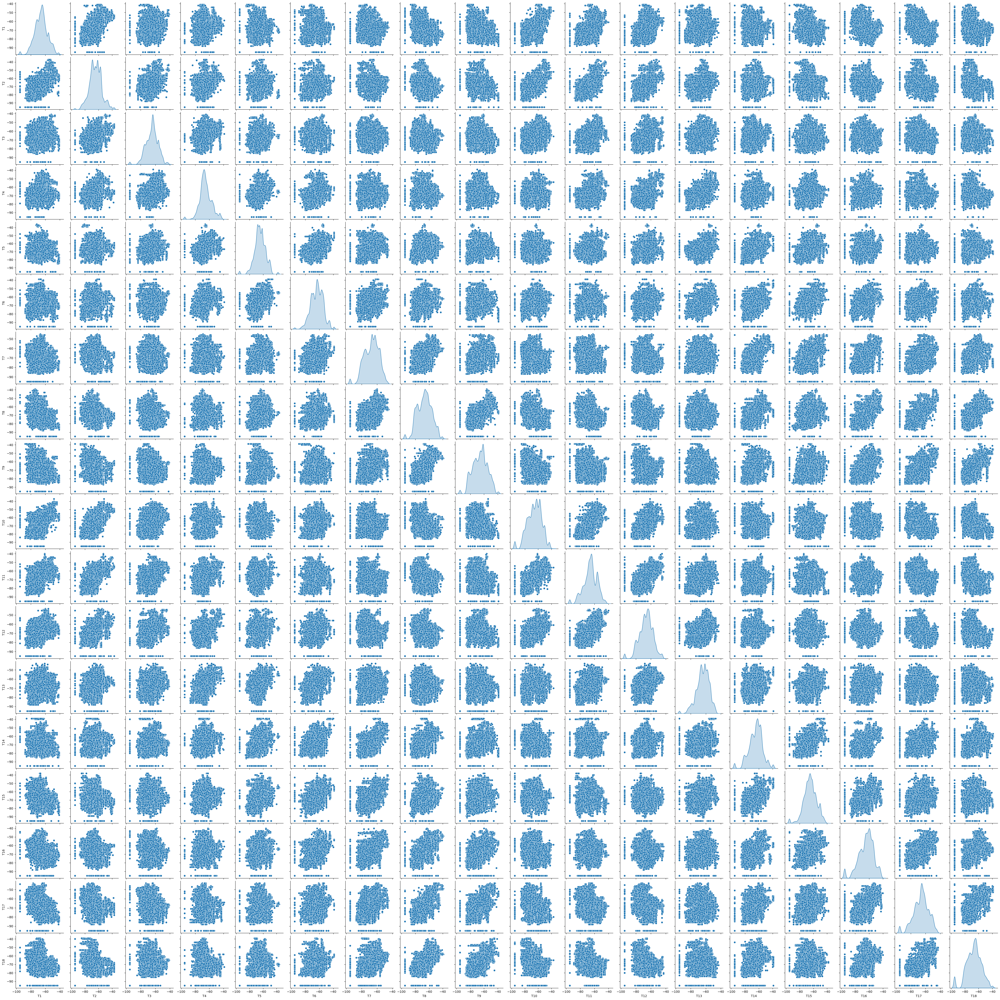

In [ ]:
# Display the first few rows of the dataframe to understand its structure
print(data.head())

# Create a pair plot for the features T1 to T18
sns.pairplot(data, vars=[f'T{i}' for i in range(1, 19)], diag_kind='kde')

# Show the plot
plt.show()

## Normalizing the Dataset

In [ ]:
# Separate features and target
features = data.drop(columns=['target'])
target = data['target']

# Normalize the data
scaler = StandardScaler()
normalized_features = scaler.fit_transform(features)
target

0        B37
1        B61
2        A19
3        A22
4        A33
        ... 
36747    B34
36748    B15
36749     A6
36750     B2
36751    B45
Name: target, Length: 36752, dtype: object

## Optimal number of clusters using the Elbow method

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

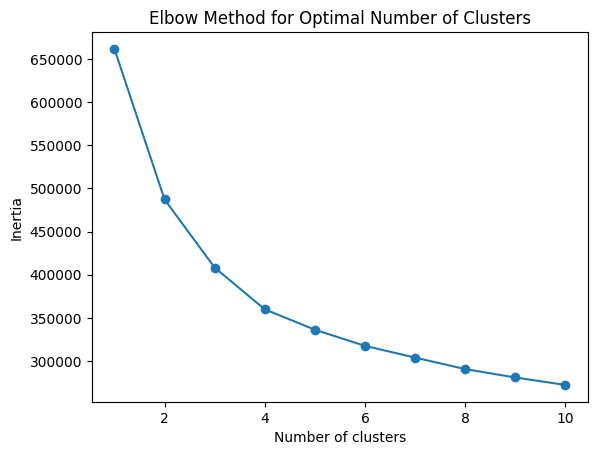

In [ ]:
inertia = []
for n in range(1, 11):
    kmeans = KMeans(n_clusters=n, random_state=42)
    kmeans.fit(normalized_features)
    inertia.append(kmeans.inertia_)

# Plot the Elbow curve
plt.plot(range(1, 11), inertia, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal Number of Clusters')
plt.show()

In [ ]:
optimal_clusters = 3  # Choose the optimal number of clusters based on the Elbow curve
kmeans = KMeans(n_clusters=optimal_clusters, random_state=42)
clusters = kmeans.fit_predict(normalized_features)

# Add cluster assignments to the original data
data['cluster'] = clusters

# Get cluster centroids
centroids = kmeans.cluster_centers_

# Denormalize the centroids
centroids = scaler.inverse_transform(centroids)

# Create a DataFrame for easier interpretation
centroids_df = pd.DataFrame(centroids, columns=features.columns)

print("Cluster Centroids:")
print(centroids_df)

# Function to identify the cluster for a new data point
def predict_cluster(new_data_point):
    new_data_point_normalized = scaler.transform([new_data_point])
    new_data_point_cluster = kmeans.predict(new_data_point_normalized)
    return new_data_point_cluster[0]

# Example usage
new_data_point = [-70, -61, -66, -53, -51, -63, -82, -57, -76, -78, -66, -66, -61, -59, -73, -75, -63, -77]
cluster_of_new_point = predict_cluster(new_data_point)
print(f'The new data point belongs to cluster: {cluster_of_new_point}')

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Cluster Centroids:
          T1         T2         T3         T4         T5         T6  \
0 -60.250602 -59.617342 -63.995497 -69.192376 -70.980312 -69.997696   
1 -63.976522 -61.746182 -60.249512 -59.386613 -58.841776 -57.693374   
2 -72.486870 -71.662101 -70.233344 -69.401524 -66.188929 -64.927055   

          T7         T8         T9        T10        T11        T12  \
0 -76.236255 -78.190701 -76.879359 -59.068384 -61.270814 -64.497434   
1 -64.591591 -65.869290 -66.042785 -62.692836 -62.266868 -61.503734   
2 -62.843249 -58.483709 -56.612336 -74.024234 -73.210407 -73.307505   

         T13        T14        T15        T16        T17        T18  
0 -66.671589 -74.041156 -72.511153 -74.903550 -76.491884 -77.922191  
1 -57.994013 -59.610024 -60.040229 -61.635318 -65.286176 -66.757753  
2 -69.057059 -62.706516 -63.821932 -58.817637 -58.473902 -57.618577  
The new data point belongs to cluster: 1


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


##DBSCAN Clustering

In [ ]:
from sklearn.cluster import DBSCAN

# Apply DBSCAN
dbscan = DBSCAN(eps=0.5, min_samples=5)
clusters = dbscan.fit_predict(normalized_features)

# Add cluster assignments to the original data
data['cluster'] = clusters


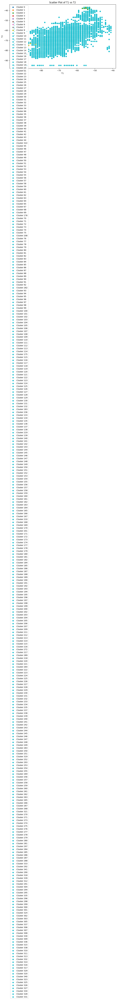

In [ ]:
import matplotlib.pyplot as plt

def plot_clusters(feature1, feature2):
    plt.figure(figsize=(10, 6))
    unique_clusters = data['cluster'].unique()
    colors = plt.cm.tab10(range(len(unique_clusters)))

    for cluster, color in zip(unique_clusters, colors):
        cluster_data = data[data['cluster'] == cluster]
        plt.scatter(cluster_data[feature1], cluster_data[feature2], label=f'Cluster {cluster}', color=color)

    plt.xlabel(feature1)
    plt.ylabel(feature2)
    plt.legend()
    plt.title(f'Scatter Plot of {feature1} vs {feature2}')
    plt.show()

# Generate scatter plot for the first two features (T1 and T2)
plot_clusters('T1', 'T2')

## Using Pycaret

In [ ]:
!pip install pycaret

In [ ]:
import pandas as pd
from pycaret.clustering import *

In [ ]:
ds = pd.read_csv('/content/drive/MyDrive/RESAI/RAI_Internship/Data/Task1and2/train.csv')
ds

,T1,T2,T3,T4,T5,T6,T7,T8,T9,T10,T11,T12,T13,T14,T15,T16,T17,T18,target
0,-70,-61,-66,-53,-51,-63,-82,-57,-76,-78,-66,-66,-61,-59,-73,-75,-63,-77,B37
1,-77,-74,-71,-76,-65,-63,-66,-52,-55,-75,-72,-75,-74,-61,-64,-63,-53,-63,B61
2,-53,-38,-55,-66,-62,-62,-65,-70,-62,-52,-56,-53,-66,-68,-72,-60,-68,-77,A19
3,-72,-62,-59,-65,-65,-65,-78,-82,-83,-59,-84,-60,-64,-83,-69,-72,-95,-73,A22
4,-67,-69,-65,-63,-59,-53,-70,-72,-71,-60,-61,-57,-54,-76,-61,-66,-71,-80,A33
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36747,-68,-62,-64,-59,-59,-71,-67,-73,-73,-69,-71,-75,-56,-68,-68,-75,-75,-95,B34
36748,-56,-50,-57,-50,-59,-60,-62,-69,-58,-64,-49,-61,-58,-56,-60,-58,-59,-64,B15
36749,-42,-58,-72,-70,-75,-72,-76,-84,-84,-59,-65,-68,-65,-81,-86,-70,-75,-74,A6
36750,-50,-50,-70,-64,-64,-68,-68,-73,-79,-58,-61,-73,-67,-77,-73,-74,-72,-81,B2


In [ ]:
ds.shape

(36752, 19)

In [ ]:
ds.drop_duplicates

<bound method DataFrame.drop_duplicates of        T1  T2  T3  T4  T5  T6  T7  T8  T9  T10  T11  T12  T13  T14  T15  T16  \
0     -70 -61 -66 -53 -51 -63 -82 -57 -76  -78  -66  -66  -61  -59  -73  -75   
1     -77 -74 -71 -76 -65 -63 -66 -52 -55  -75  -72  -75  -74  -61  -64  -63   
2     -53 -38 -55 -66 -62 -62 -65 -70 -62  -52  -56  -53  -66  -68  -72  -60   
3     -72 -62 -59 -65 -65 -65 -78 -82 -83  -59  -84  -60  -64  -83  -69  -72   
4     -67 -69 -65 -63 -59 -53 -70 -72 -71  -60  -61  -57  -54  -76  -61  -66   
...    ..  ..  ..  ..  ..  ..  ..  ..  ..  ...  ...  ...  ...  ...  ...  ...   
36747 -68 -62 -64 -59 -59 -71 -67 -73 -73  -69  -71  -75  -56  -68  -68  -75   
36748 -56 -50 -57 -50 -59 -60 -62 -69 -58  -64  -49  -61  -58  -56  -60  -58   
36749 -42 -58 -72 -70 -75 -72 -76 -84 -84  -59  -65  -68  -65  -81  -86  -70   
36750 -50 -50 -70 -64 -64 -68 -68 -73 -79  -58  -61  -73  -67  -77  -73  -74   
36751 -66 -64 -70 -62 -59 -62 -53 -58 -64  -80  -73  -83  -67  -61  -56  -61   

       T17  T18 target  
0      -63  -77    B37  
1      -53  -63    B61  
2      -68  -77    A19  
3      -95  -73    A22  
4      -71  -80    A33  
...    ...  ...    ...  
36747  -75  -95    B34  
36748  -59  -64    B15  
36749  -75  -74     A6  
36750  -72  -81     B2  
36751  -67  -65    B45  

[36752 rows x 19 columns]>

In [ ]:
ds.shape

(36752, 19)

In [ ]:
data_trin = ds.sample(frac=0.95, random_state=786)

In [ ]:
data_test = ds.drop(data_trin.index)

In [ ]:
data_test.shape

(1838, 19)

In [ ]:
data_trin.reset_index(drop=True, inplace=True)

In [ ]:
data_test.reset_index(drop=True, inplace=True)

In [ ]:
from pycaret.clustering import *

In [ ]:
clust = setup(data = data_trin, normalize=True, session_id= 123)

,Description,Value
0,Session id,123
1,Original data shape,"(34914, 19)"
2,Transformed data shape,"(34914, 178)"
3,Numeric features,18
4,Categorical features,1
5,Preprocess,True
6,Imputation type,simple
7,Numeric imputation,mean
8,Categorical imputation,mode
9,Maximum one-hot encoding,-1


In [ ]:
kmeans = create_model('kmeans')

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.0458,584.9635,3.1865,0,0,0


Processing:   0%|          | 0/3 [00:00<?, ?it/s]

In [ ]:
print(kmeans)

KMeans(algorithm='lloyd', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=4, n_init='auto', random_state=123, tol=0.0001, verbose=0)


In [ ]:
models()

,Name,Reference
ID,,
kmeans,K-Means Clustering,sklearn.cluster._kmeans.KMeans
ap,Affinity Propagation,sklearn.cluster._affinity_propagation.Affinity...
meanshift,Mean Shift Clustering,sklearn.cluster._mean_shift.MeanShift
sc,Spectral Clustering,sklearn.cluster._spectral.SpectralClustering
hclust,Agglomerative Clustering,sklearn.cluster._agglomerative.AgglomerativeCl...
dbscan,Density-Based Spatial Clustering,sklearn.cluster._dbscan.DBSCAN
optics,OPTICS Clustering,sklearn.cluster._optics.OPTICS
birch,Birch Clustering,sklearn.cluster._birch.Birch


In [ ]:
!pip install kmodes

In [ ]:
from kmodes.kmodes import KModes

kmodes_model = KModes(n_clusters=3, init='Huang', n_init=5, verbose=1) # Adjust parameters as needed
kmodes_model.fit_predict(data_trin)

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 8587, cost: 600621.0
Run 1, iteration: 2/100, moves: 737, cost: 600621.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 10343, cost: 597896.0
Run 2, iteration: 2/100, moves: 1421, cost: 597896.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 7760, cost: 601098.0
Run 3, iteration: 2/100, moves: 1215, cost: 600518.0
Run 3, iteration: 3/100, moves: 139, cost: 600518.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100, moves: 8405, cost: 599096.0
Run 4, iteration: 2/100, moves: 2782, cost: 599096.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 5, iteration: 1/100, moves: 9388, cost: 599297.0
Run 5, iteration: 2/100, moves: 3198, cost: 599046.0
Run 5, iteration: 

array([0, 0, 0, ..., 0, 0, 1], dtype=uint16)

In [ ]:
print(kmodes_model)
models()

KModes(cat_dissim=<function matching_dissim at 0x7a04b0db51b0>, init='Huang',
       max_iter=100, n_clusters=3, n_init=5, n_jobs=1, random_state=None,
       verbose=1)


,Name,Reference
ID,,
kmeans,K-Means Clustering,sklearn.cluster._kmeans.KMeans
ap,Affinity Propagation,sklearn.cluster._affinity_propagation.Affinity...
meanshift,Mean Shift Clustering,sklearn.cluster._mean_shift.MeanShift
sc,Spectral Clustering,sklearn.cluster._spectral.SpectralClustering
hclust,Agglomerative Clustering,sklearn.cluster._agglomerative.AgglomerativeCl...
dbscan,Density-Based Spatial Clustering,sklearn.cluster._dbscan.DBSCAN
optics,OPTICS Clustering,sklearn.cluster._optics.OPTICS
birch,Birch Clustering,sklearn.cluster._birch.Birch


In [ ]:
kmeans_results=assign_model(kmeans)
kmeans_results.head()

,T1,T2,T3,T4,T5,T6,T7,T8,T9,T10,T11,T12,T13,T14,T15,T16,T17,T18,target,Cluster
0,-64,-66,-65,-61,-61,-65,-75,-75,-82,-67,-63,-74,-58,-73,-61,-65,-70,-81,A34,Cluster 3
1,-64,-69,-62,-59,-63,-61,-65,-66,-69,-71,-72,-62,-65,-60,-50,-57,-55,-79,A46,Cluster 0
2,-56,-61,-77,-45,-57,-57,-56,-66,-60,-62,-61,-49,-58,-61,-69,-67,-68,-80,B27,Cluster 3
3,-71,-82,-72,-69,-70,-63,-74,-55,-46,-75,-67,-65,-67,-60,-78,-63,-51,-40,B71,Cluster 0
4,-77,-69,-76,-66,-67,-62,-81,-63,-50,-72,-76,-81,-65,-70,-74,-56,-67,-52,A73,Cluster 0
